# Librerías

In [1]:
import pandas as pd 
import numpy as np 
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

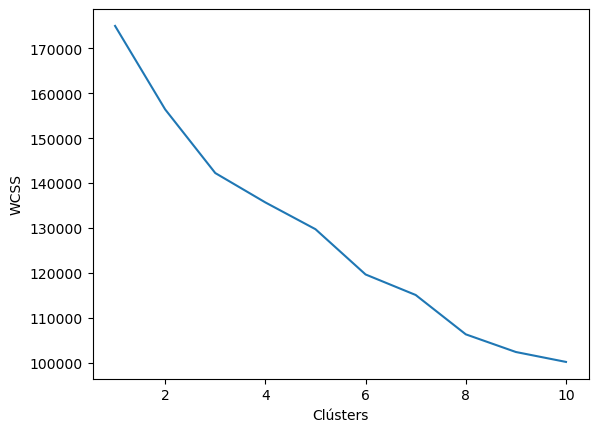

In [2]:
df = pd.read_csv('ActoresFilter.csv', sep=',')
X = df.select_dtypes(include=[np.number])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

wcss = []

for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.xlabel('Clústers')
plt.ylabel('WCSS')
plt.show()



In [3]:
df

,Age,Years Active,Beauty,Skill Level,Award Wins,Media Mentions,Social Media Followers,Social Media Likes,Network Size,Income,...,Gender_Male,Nationality_Canada,Nationality_USA,Genre Specialization_Action,Genre Specialization_Comedy,Genre Specialization_Drama,Genre Specialization_Horror,Genre Specialization_Musical,Genre Specialization_Sci-Fi,Recommendation_Score
0,0.019608,0.033333,0.641871,0.347386,0.3125,0.714286,0.357385,0.382643,0.290323,0.107866,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.316288
1,0.588235,0.633333,0.513037,0.405143,0.5000,0.408163,0.546893,0.565680,0.548387,0.407797,...,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.498405
2,0.607843,0.766667,0.478528,0.411467,0.6250,0.591837,0.475154,0.429586,0.322581,0.623391,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.555988
3,0.450980,0.500000,0.528374,0.655565,0.4375,0.510204,0.430921,0.418540,0.387097,0.260946,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.521374
4,0.392157,0.633333,0.371933,0.410624,0.5625,0.428571,0.201880,0.283235,0.290323,0.322630,...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.445587
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7949,0.666667,0.366667,0.519172,0.083052,0.1875,0.836735,0.697629,0.705720,0.419355,0.147522,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.358948
7950,0.254902,0.433333,0.492331,0.275717,0.3125,0.571429,0.415302,0.451282,0.483871,0.202403,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.372085
7951,0.588235,0.366667,0.483896,0.712901,0.5000,0.387755,0.315157,0.414201,0.387097,0.174865,...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.489010
7952,0.019608,0.033333,0.490798,0.245363,0.2500,0.469388,0.521943,0.508876,0.419355,0.070357,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.281603


## Se elige un $k=5$

In [4]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=5, init='k-means++', random_state=42)
df['Cluster'] = kmeans.fit_predict(X_scaled)

In [5]:
df

,Age,Years Active,Beauty,Skill Level,Award Wins,Media Mentions,Social Media Followers,Social Media Likes,Network Size,Income,...,Nationality_Canada,Nationality_USA,Genre Specialization_Action,Genre Specialization_Comedy,Genre Specialization_Drama,Genre Specialization_Horror,Genre Specialization_Musical,Genre Specialization_Sci-Fi,Recommendation_Score,Cluster
0,0.019608,0.033333,0.641871,0.347386,0.3125,0.714286,0.357385,0.382643,0.290323,0.107866,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.316288,0
1,0.588235,0.633333,0.513037,0.405143,0.5000,0.408163,0.546893,0.565680,0.548387,0.407797,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.498405,2
2,0.607843,0.766667,0.478528,0.411467,0.6250,0.591837,0.475154,0.429586,0.322581,0.623391,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.555988,2
3,0.450980,0.500000,0.528374,0.655565,0.4375,0.510204,0.430921,0.418540,0.387097,0.260946,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.521374,2
4,0.392157,0.633333,0.371933,0.410624,0.5625,0.428571,0.201880,0.283235,0.290323,0.322630,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.445587,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7949,0.666667,0.366667,0.519172,0.083052,0.1875,0.836735,0.697629,0.705720,0.419355,0.147522,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.358948,3
7950,0.254902,0.433333,0.492331,0.275717,0.3125,0.571429,0.415302,0.451282,0.483871,0.202403,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.372085,0
7951,0.588235,0.366667,0.483896,0.712901,0.5000,0.387755,0.315157,0.414201,0.387097,0.174865,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.489010,3
7952,0.019608,0.033333,0.490798,0.245363,0.2500,0.469388,0.521943,0.508876,0.419355,0.070357,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.281603,1


In [6]:
cluster_sumary = df.groupby('Cluster').mean()
cluster_sumary

,Age,Years Active,Beauty,Skill Level,Award Wins,Media Mentions,Social Media Followers,Social Media Likes,Network Size,Income,...,Gender_Male,Nationality_Canada,Nationality_USA,Genre Specialization_Action,Genre Specialization_Comedy,Genre Specialization_Drama,Genre Specialization_Horror,Genre Specialization_Musical,Genre Specialization_Sci-Fi,Recommendation_Score
Cluster,,,,,,,,,,,,,,,,,,,,,
0,0.266864,0.329565,0.509194,0.323190,0.339676,0.410580,0.402656,0.436868,0.377797,0.199297,...,0.019139,0.132775,0.867225,0.284091,0.604665,0.000000,0.062799,0.000000,0.048445,0.352394
1,0.269069,0.333125,0.565731,0.324023,0.340852,0.422225,0.406952,0.450859,0.379529,0.203476,...,0.072486,0.127046,0.872954,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.355615
2,0.477665,0.528923,0.514630,0.504527,0.557258,0.483118,0.468775,0.493378,0.404931,0.388072,...,0.432369,0.154755,0.845245,0.272888,0.288246,0.266982,0.056113,0.002363,0.113408,0.510661
3,0.419563,0.436826,0.409614,0.334150,0.340755,0.417762,0.406839,0.443707,0.378940,0.193764,...,0.998927,0.115880,0.884120,0.394850,0.119814,0.130544,0.114449,0.000000,0.240343,0.378905
4,0.340484,0.395882,0.629561,0.376578,0.399265,0.429292,0.415426,0.460088,0.382985,0.216070,...,0.243137,0.156863,0.843137,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.398017


In [7]:
df.columns

Index(['Age', 'Years Active', 'Beauty', 'Skill Level', 'Award Wins',
       'Media Mentions', 'Social Media Followers', 'Social Media Likes',
       'Network Size', 'Income', 'Education Rank', 'Gender_Female',
       'Gender_Male', 'Nationality_Canada', 'Nationality_USA',
       'Genre Specialization_Action', 'Genre Specialization_Comedy',
       'Genre Specialization_Drama', 'Genre Specialization_Horror',
       'Genre Specialization_Musical', 'Genre Specialization_Sci-Fi',
       'Recommendation_Score', 'Cluster'],
      dtype='object')

## Decision Tree


In [8]:
X = df.drop(columns=['Cluster'])
y = df['Cluster']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

dt_classifier = DecisionTreeClassifier(max_depth=5, min_samples_split=10, random_state=42)

dt_classifier.fit(X_train, y_train)

y_pred = dt_classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Precisión: {accuracy:.2f}")
print('Classification Report:\n', report)

Precisión: 0.93
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.92      0.94       689
           1       0.98      0.89      0.93       496
           2       0.87      0.87      0.87       677
           3       0.91      0.98      0.94      1121
           4       1.00      0.99      1.00       199

    accuracy                           0.93      3182
   macro avg       0.94      0.93      0.94      3182
weighted avg       0.93      0.93      0.93      3182



## Random Forest

In [9]:
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)
y_pred = rf_classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Precisión: {accuracy:.2f}")
print('Classification Report:\n', report)

Precisión: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.97      0.97       689
           1       0.99      0.94      0.96       496
           2       0.94      0.91      0.93       677
           3       0.95      0.98      0.97      1121
           4       0.99      0.99      0.99       199

    accuracy                           0.96      3182
   macro avg       0.97      0.96      0.96      3182
weighted avg       0.96      0.96      0.96      3182



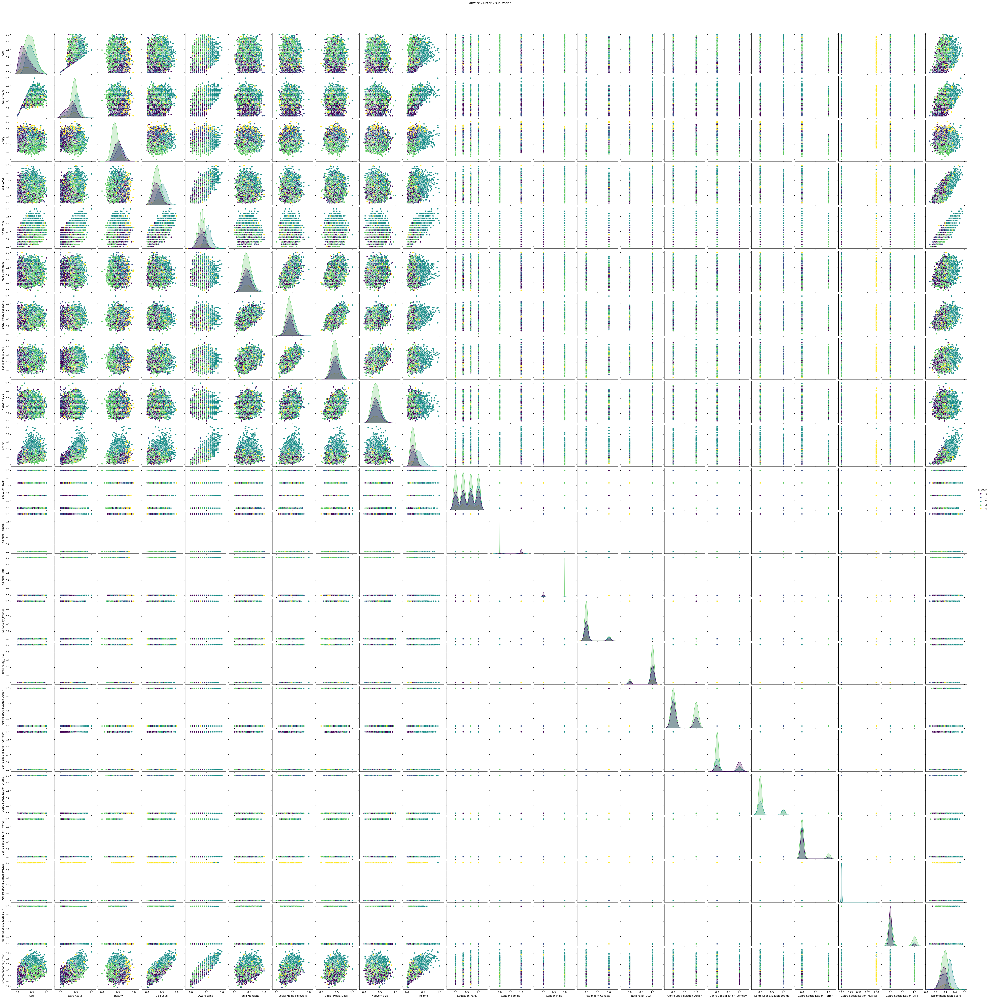

In [10]:
sns.pairplot(df, hue='Cluster', palette='viridis', diag_kind='kde', markers='o')

plt.suptitle('Pairwise Cluster Visualization', y=1.02)
plt.show()

In [11]:
df

,Age,Years Active,Beauty,Skill Level,Award Wins,Media Mentions,Social Media Followers,Social Media Likes,Network Size,Income,...,Nationality_Canada,Nationality_USA,Genre Specialization_Action,Genre Specialization_Comedy,Genre Specialization_Drama,Genre Specialization_Horror,Genre Specialization_Musical,Genre Specialization_Sci-Fi,Recommendation_Score,Cluster
0,0.019608,0.033333,0.641871,0.347386,0.3125,0.714286,0.357385,0.382643,0.290323,0.107866,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.316288,0
1,0.588235,0.633333,0.513037,0.405143,0.5000,0.408163,0.546893,0.565680,0.548387,0.407797,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.498405,2
2,0.607843,0.766667,0.478528,0.411467,0.6250,0.591837,0.475154,0.429586,0.322581,0.623391,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.555988,2
3,0.450980,0.500000,0.528374,0.655565,0.4375,0.510204,0.430921,0.418540,0.387097,0.260946,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.521374,2
4,0.392157,0.633333,0.371933,0.410624,0.5625,0.428571,0.201880,0.283235,0.290323,0.322630,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.445587,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7949,0.666667,0.366667,0.519172,0.083052,0.1875,0.836735,0.697629,0.705720,0.419355,0.147522,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.358948,3
7950,0.254902,0.433333,0.492331,0.275717,0.3125,0.571429,0.415302,0.451282,0.483871,0.202403,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.372085,0
7951,0.588235,0.366667,0.483896,0.712901,0.5000,0.387755,0.315157,0.414201,0.387097,0.174865,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.489010,3
7952,0.019608,0.033333,0.490798,0.245363,0.2500,0.469388,0.521943,0.508876,0.419355,0.070357,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.281603,1
